Analysis Scripts for QC calculations 

In [ ]:
import scanpy as sc
import os
import bin2cell as b2c
import anndata
import celltypist
from celltypist import models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os, scanpy as sc, pandas as pd, bin2cell as b2c
import seaborn as sns, matplotlib.pyplot as plt

In [45]:
sns.set(style="whitegrid", palette="muted", font_scale=1.2)

FEATURES = [
    'n_genes_by_counts', 'log1p_n_genes_by_counts',
    'total_counts', 'log1p_total_counts',
    'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes'
]

# for loading visium data (002 um and 008 um)
def load_qc_from_visium_bin(label, folder_path):
    h5_path = os.path.join(folder_path, "filtered_feature_bc_matrix.h5")
    
    if not os.path.exists(h5_path):
        print(f"[SKIPPED] {label}: Matrix file not found at {h5_path}")
        return pd.DataFrame(columns=FEATURES + ["dataset"])

    try:
        adata = sc.read_10x_h5(h5_path)
        adata.var_names_make_unique()
        sc.pp.filter_cells(adata, min_genes=100)
        if adata.shape[0] == 0:
            print(f"[SKIPPED] {label}: No cells retained after filtering.")
            return pd.DataFrame(columns=FEATURES + ["dataset"])

        sc.pp.calculate_qc_metrics(adata, inplace=True)
        sc.pp.normalize_total(adata, target_sum=1e4)
        sc.pp.log1p(adata)

        adata.obs["dataset"] = label
        return adata.obs[FEATURES + ["dataset"]]
    
    except Exception as e:
        print(f"[ERROR] {label}: {e}")
        return pd.DataFrame(columns=FEATURES + ["dataset"])

def load_qc_from_h5(label, path):
    print(f"Loading: {label}")
    
    # Read AnnData
    adata = sc.read_h5ad(path) if path.endswith(".h5ad") else sc.read(path)
    adata.var_names_make_unique()

    # ENACT no filter
    if "enact" not in label:
        sc.pp.filter_cells(adata, min_genes=100)

    if adata.shape[0] == 0:
        print(f"[SKIPPED] {label} = No cells present.")
        return pd.DataFrame(columns=FEATURES + ["dataset"])

    try:
        sc.pp.calculate_qc_metrics(adata, inplace=True)
        sc.pp.normalize_total(adata, target_sum=1e4)
        sc.pp.log1p(adata)
    except Exception as e:
        print(f"[ERROR] {label}: {e}")
        return pd.DataFrame(columns=FEATURES + ["dataset"])
    adata.obs["dataset"] = label
    return adata.obs[FEATURES + ["dataset"]]


In [ ]:
# data paths 
paths = {
    # P1CRC
    "P1CRC_2um": "/gpfs/commons/groups/innovation/jjoseph/data/P1_CRC/binned_outputs/square_002um/",
    "P1CRC_8um": "/gpfs/commons/groups/innovation/jjoseph/data/P1_CRC/binned_outputs/square_008um/",
    "P1CRC_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P1_CRC/P1_CRC_b2c_cells.h5ad",

    # P2CRC
    "P2CRC_2um": "/gpfs/commons/groups/innovation/jjoseph/data/P2_CRC/binned_outputs/square_002um/",
    "P2CRC_8um": "/gpfs/commons/groups/innovation/jjoseph/data/P2_CRC/binned_outputs/square_008um/",
    "P2CRC_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P2CRC/P2CRC_b2c_cells.h5ad",
    "P2CRC_enact": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2CRC_gpu_weighted_by_area_nbins2/tmap/weighted_by_area|celltypist_cells_adata.h5",

    # P3NAT
    "P3NAT_2um": "/gpfs/commons/groups/innovation/jjoseph/data/P3_NAT/binned_outputs/square_002um/",
    "P3NAT_8um": "/gpfs/commons/groups/innovation/jjoseph/data/P3_NAT/binned_outputs/square_008um/",
    "P3NAT_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P3_NAT/P3_NAT_b2c_cells.h5ad",

    # P5CRC
    "P5CRC_2um": "/gpfs/commons/groups/innovation/jjoseph/data/P5_CRC/binned_outputs/square_002um/",
    "P5CRC_8um": "/gpfs/commons/groups/innovation/jjoseph/data/P5_CRC/binned_outputs/square_008um/",
    "P5CRC_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P5CRC/P5CRC_b2c_cells.h5ad",
    "P5CRC_enact": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_weighted_by_area_nbins2/tmap/weighted_by_area|celltypist_cells_adata.h5",

    # P5NAT
    "P5NAT_2um": "/gpfs/commons/groups/innovation/jjoseph/data/P5_NAT/binned_outputs/square_002um/",
    "P5NAT_8um": "/gpfs/commons/groups/innovation/jjoseph/data/P5_NAT/binned_outputs/square_008um/",
    "P5NAT_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P5_NAT/P5_NAT_b2c_cells.h5ad",

    # JG samples
    "JGCRC14NT_2um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC14NT/outs/binned_outputs/square_002um/",
    "JGCRC14NT_8um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC14NT/outs/binned_outputs/square_008um/",
    "JGCRC14NT_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC14NT/JGCRC14NT_b2c_cells.h5ad",

    "JGCRC5T_2um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC5T/outs/binned_outputs/square_002um/",
    "JGCRC5T_8um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC5T/outs/binned_outputs/square_008um/",
    "JGCRC5T_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC5T/JGCRC5T_b2c_cells.h5ad",

    "JGCRC27T_2um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC27T/outs/binned_outputs/square_002um/",
    "JGCRC27T_8um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC27T/outs/binned_outputs/square_008um/",
    "JGCRC27T_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC27T/JGCRC27T_b2c_cells.h5ad",

    "JGCRC41T_2um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC41T/outs/binned_outputs/square_002um/",
    "JGCRC41T_8um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC41T/outs/binned_outputs/square_008um/",
    "JGCRC41T_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC41T/JGCRC41T_b2c_cells.h5ad",

    "JGCRC47TA_2um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC47TA/outs/binned_outputs/square_002um/",
    "JGCRC47TA_8um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC47TA/outs/binned_outputs/square_008um/",
    "JGCRC47TA_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC47TA/JGCRC47TA_b2c_cells.h5ad",

    "JGCRC47TB_2um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC47TB/outs/binned_outputs/square_002um/",
    "JGCRC47TB_8um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC47TB/outs/binned_outputs/square_008um/",
    "JGCRC47TB_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC47TB/JGCRC47TB_b2c_cells.h5ad",

    "JGCRC46_2um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC46/outs/binned_outputs/square_002um/",
    "JGCRC46_8um": "/gpfs/commons/home/slee/innovation/share/Spaceranger/ultima/JGCRC46/outs/binned_outputs/square_008um/",
    "JGCRC46_bin2cell": "/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/JGCRC46/JGCRC46_b2c_cells.h5ad",
}

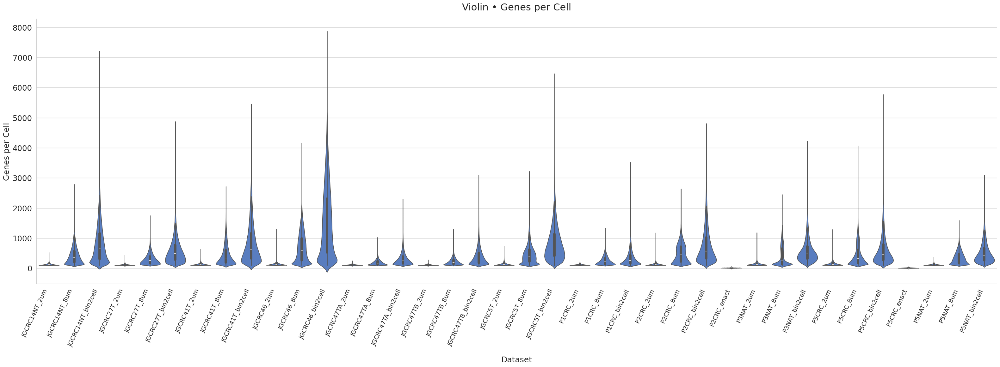

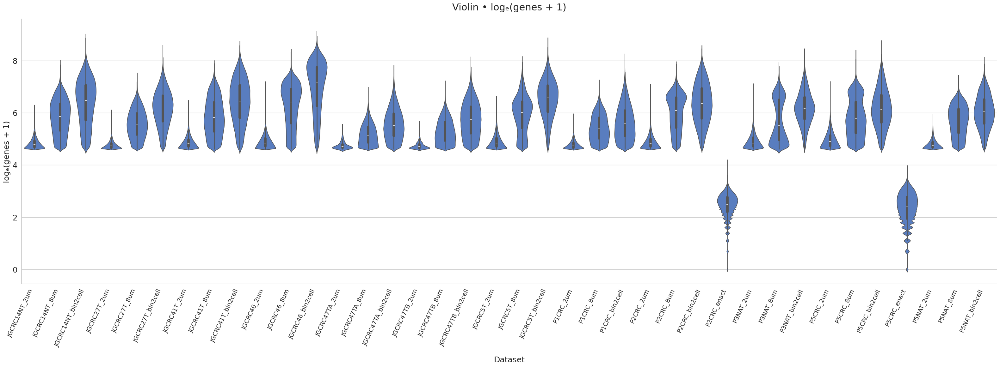

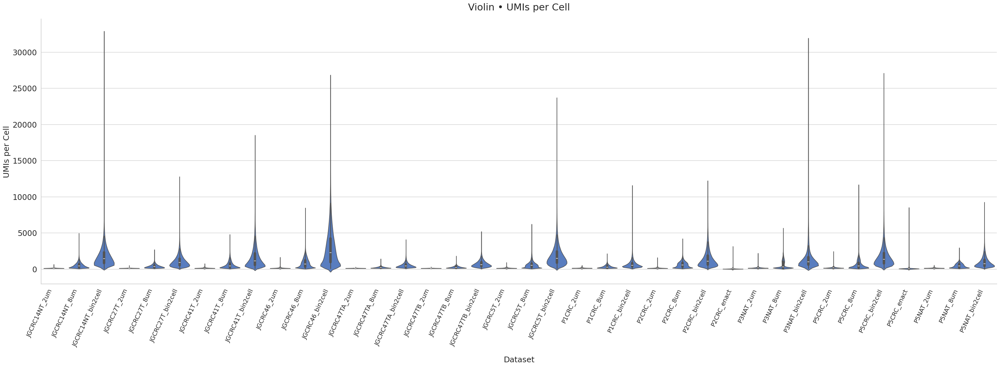

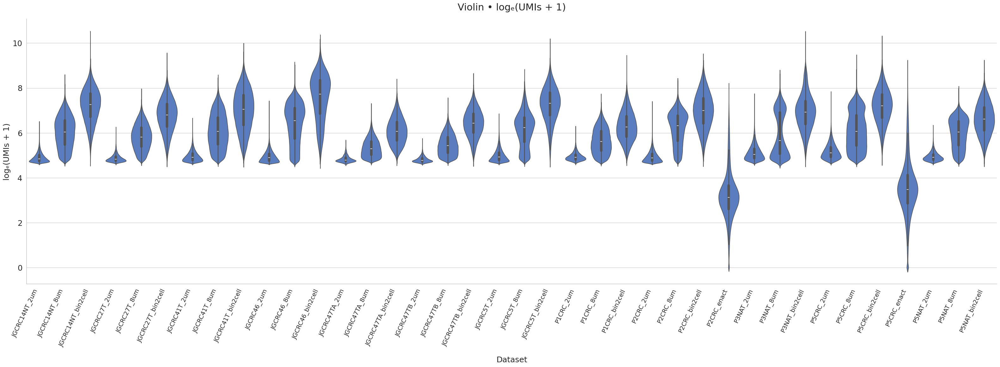

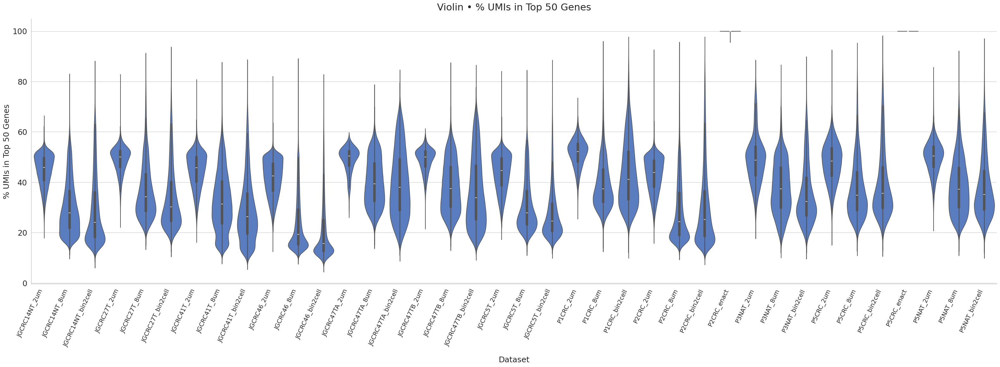

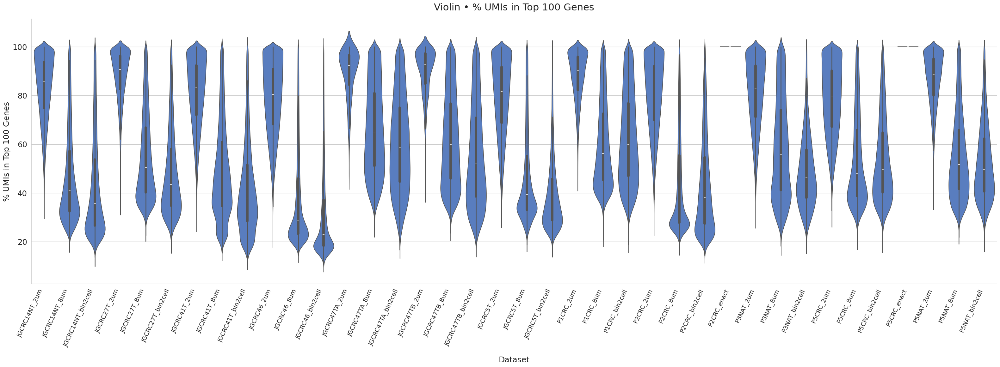

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Style
sns.set(style="whitegrid", palette="muted", font_scale=1.6)

titles = [
    ('n_genes_by_counts',            'Genes per Cell'),
    ('log1p_n_genes_by_counts',      'logₑ(genes + 1)'),
    ('total_counts',                 'UMIs per Cell'),
    ('log1p_total_counts',           'logₑ(UMIs + 1)'),
    ('pct_counts_in_top_50_genes',   '% UMIs in Top 50 Genes'),
    ('pct_counts_in_top_100_genes',  '% UMIs in Top 100 Genes')
]

ordered_labels = sorted(qc_all_df["dataset"].unique())

for feat, ttl in titles:
    plt.figure(figsize=(32, 12))  

    ax = sns.violinplot(
        data=qc_all_df,
        x="dataset",
        y=feat,
        scale='width',
        inner='box',
        order=ordered_labels
    )

    ax.set_xticklabels(ax.get_xticklabels(), rotation=65, ha='right', fontsize=14)
    ax.set_xlabel("Dataset", fontsize=18, labelpad=20)
    ax.set_ylabel(ttl, fontsize=18)
    ax.set_title(f'Violin • {ttl}', fontsize=22, pad=20)
    sns.despine()
    plt.tight_layout()
    plt.show()


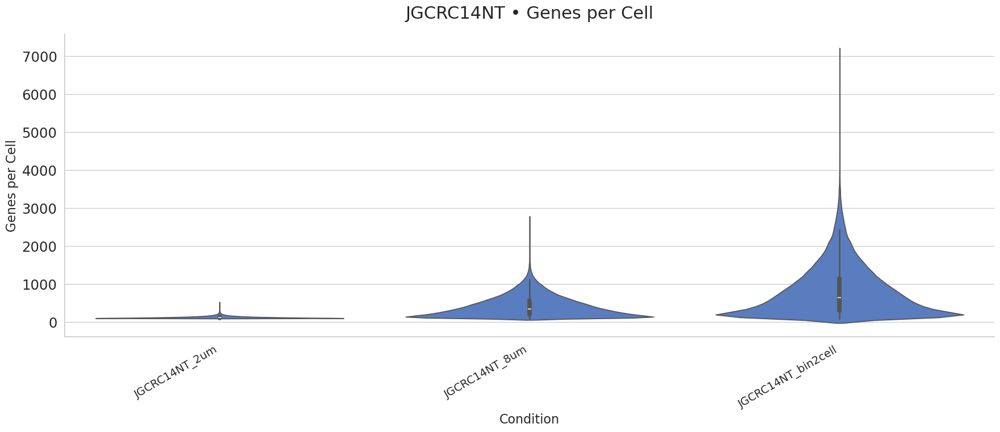

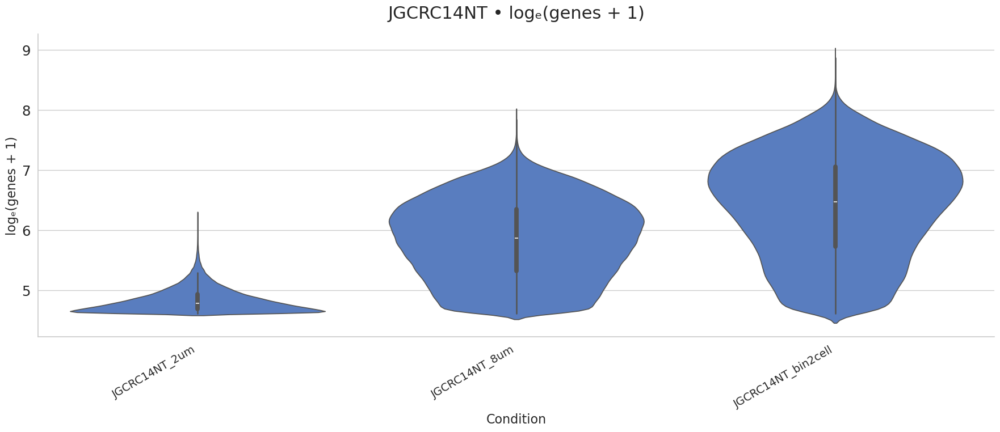

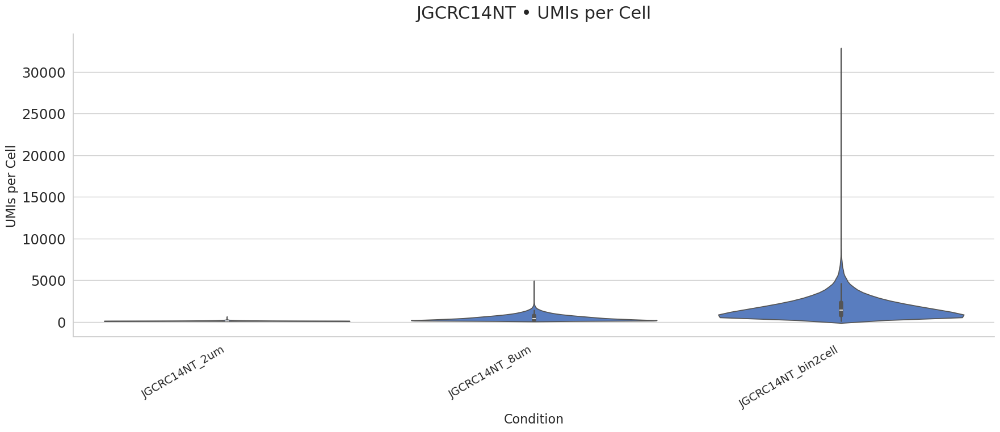

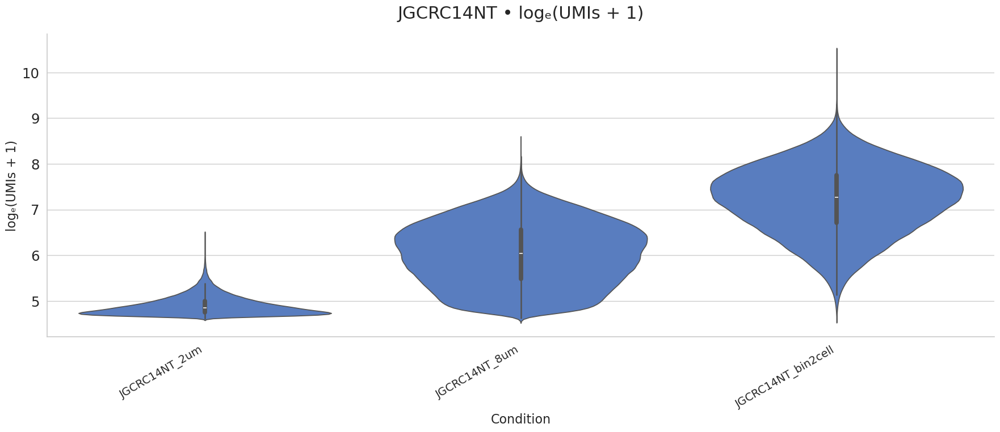

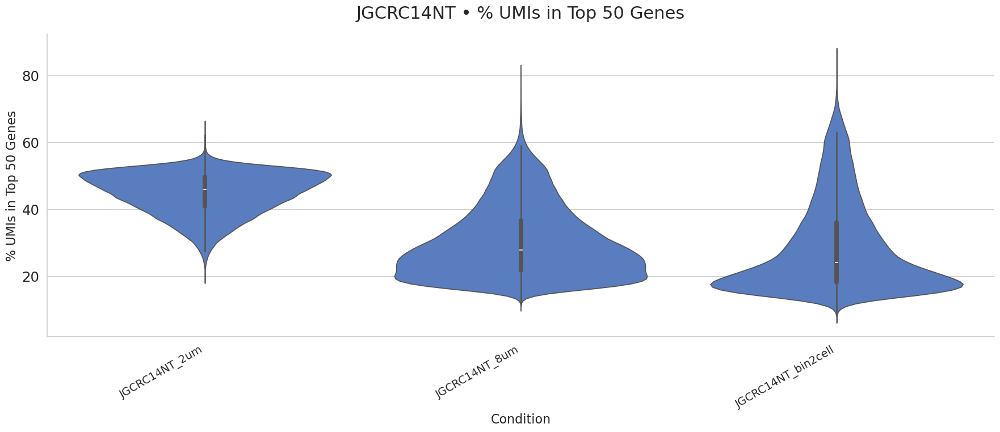

...

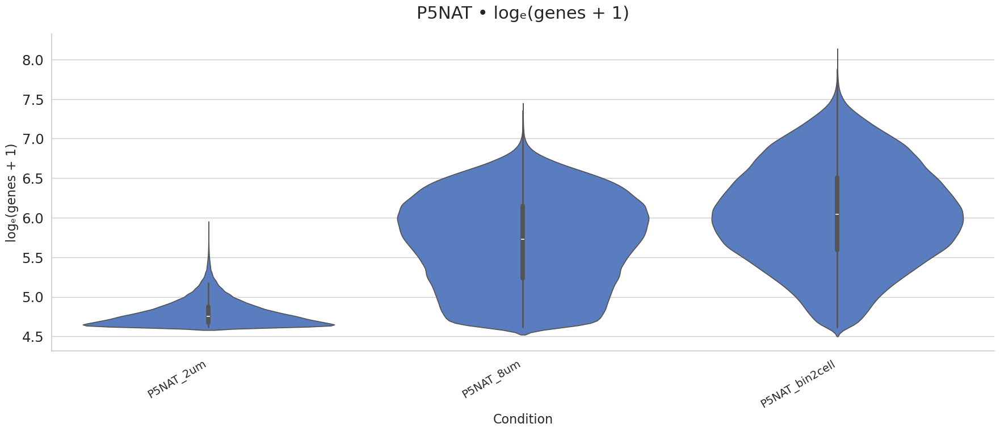

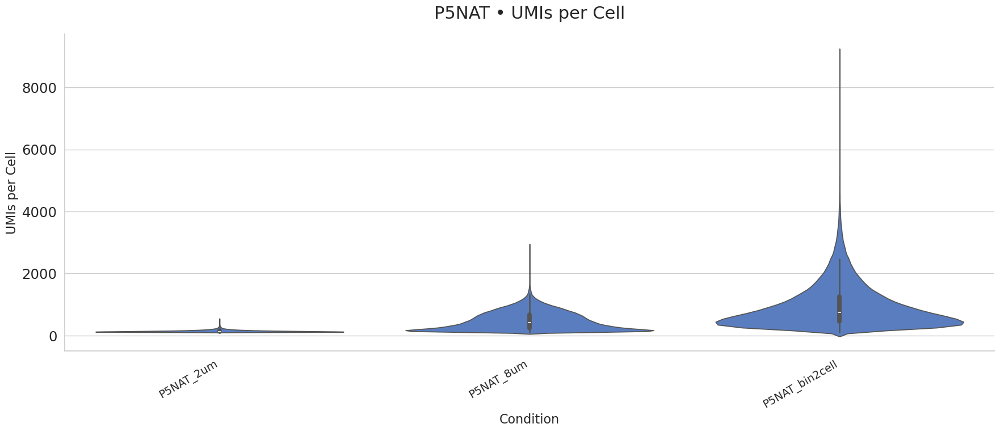

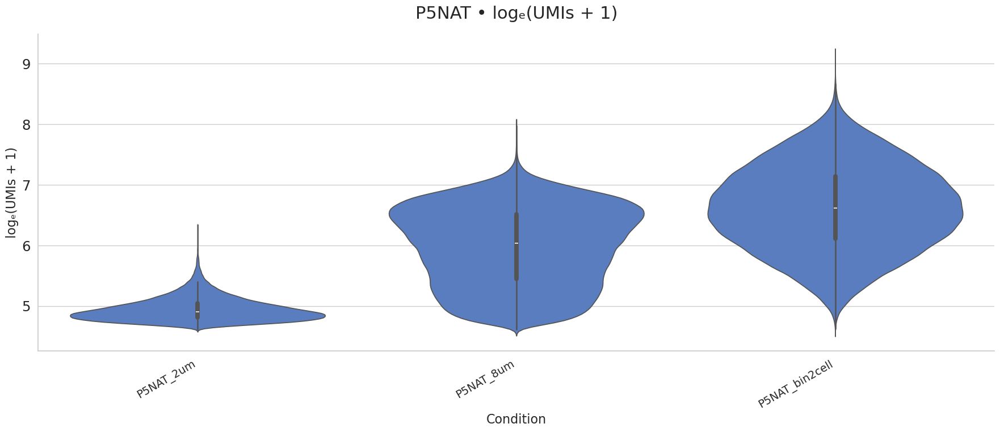

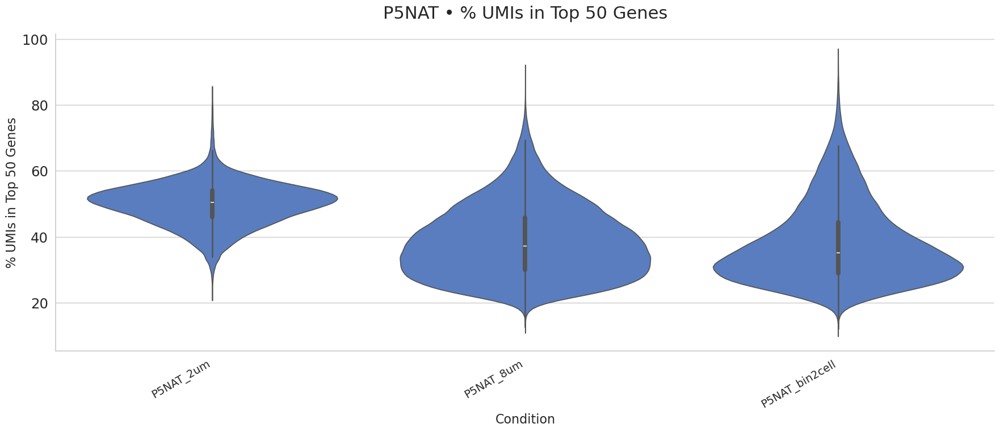

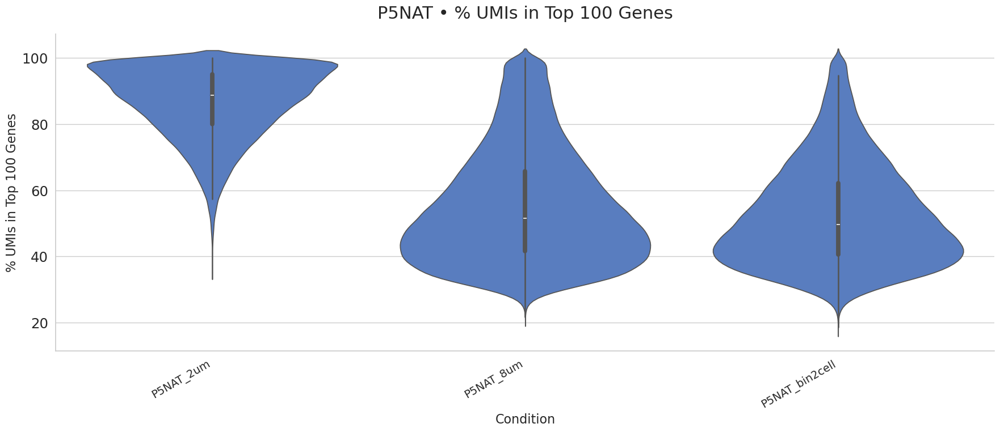

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plotting style
sns.set(style="whitegrid", palette="muted", font_scale=1.6)

# Extract base sample names 
sample_names = sorted(set(label.split('_')[0] for label in qc_all_df['dataset'].unique()))

# Define QC features to plot
features = [
    ('n_genes_by_counts',            'Genes per Cell'),
    ('log1p_n_genes_by_counts',      'logₑ(genes + 1)'),
    ('total_counts',                 'UMIs per Cell'),
    #('log1p_total_counts',           'logₑ(UMIs + 1)'),
    #('pct_counts_in_top_50_genes',   '% UMIs in Top 50 Genes'),
    ('pct_counts_in_top_100_genes',  '% UMIs in Top 100 Genes')
]

# Loop through each sample and each feature
for sample in sample_names:
    sample_df = qc_all_df[qc_all_df['dataset'].str.startswith(sample)]

    for feat, ttl in features:
        plt.figure(figsize=(18, 8))
        ax = sns.violinplot(
            data=sample_df,
            x="dataset",
            y=feat,
            scale='width',
            inner='box'
        )

        ax.set_title(f"{sample} • {ttl}", fontsize=22, pad=20)
        ax.set_xlabel("Condition", fontsize=16)
        ax.set_ylabel(ttl, fontsize=16)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right", fontsize=14)

        sns.despine()
        plt.tight_layout()
        plt.show()


# Enact Comparing Methods ie (Area, Genes, Cluster, Naive)

In [48]:
enact_paths = {
    # P2 CRC
    "P2_naive": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2CRC_gpu_naive_default/tmap/naive|celltypist_cells_adata.h5",
    "P2_weighted_by_area": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2CRC_gpu_weighted_by_area_default/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P2_weighted_by_cluster": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2CRC_gpu_weighted_by_cluster_default/tmap/weighted_by_cluster|celltypist_cells_adata.h5",
    "P2_weighted_by_gene": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2CRC_gpu_weighted_by_gene_default/tmap/weighted_by_gene|celltypist_cells_adata.h5",
    # P5 CRC
    "P5_naive": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_naive_default/tmap/naive|celltypist_cells_adata.h5",
    "P5_weighted_by_area": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_weighted_by_area_default/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P5_weighted_by_cluster": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_weighted_by_cluster_default/tmap/weighted_by_cluster|celltypist_cells_adata.h5",
    "P5_weighted_by_gene": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_weighted_by_gene_default/tmap/weighted_by_gene|celltypist_cells_adata.h5",
}

In [49]:
def load_qc_from_h5(label, path):
    print(f"Loading: {label}")
    
    adata = sc.read_h5ad(path) if path.endswith(".h5ad") else sc.read(path)
    adata.var_names_make_unique()

    if "counts" in adata.layers:
        adata.X = adata.layers["counts"].copy()

    if adata.shape[0] == 0:
        print(f"[SKIPPED] {label} → No cells present.")
        return pd.DataFrame(columns=FEATURES + ["dataset"])

    try:
        sc.pp.calculate_qc_metrics(adata, inplace=True)

        # Ensure X is float32
        if not sp.issparse(adata.X):
            adata.X = sp.csr_matrix(adata.X)
        adata.X = adata.X.astype("float32")

        adata.obs["dataset"] = label
        return adata.obs[FEATURES + ["dataset"]]
    except Exception as e:
        print(f"[ERROR] {label}: {e}")
        return pd.DataFrame(columns=FEATURES + ["dataset"])

dfs = []
for label, path in enact_paths.items():
    df = load_qc_from_h5(label, path)
    if not df.empty:
        sample, method = label.split("_", 1)
        df["sample"] = sample
        df["method"] = method
        dfs.append(df)

qc_enact_df = pd.concat(dfs, ignore_index=True)


Loading: P2_naive
Loading: P2_weighted_by_area
Loading: P2_weighted_by_cluster
Loading: P2_weighted_by_gene
Loading: P5_naive
Loading: P5_weighted_by_area
Loading: P5_weighted_by_cluster
Loading: P5_weighted_by_gene


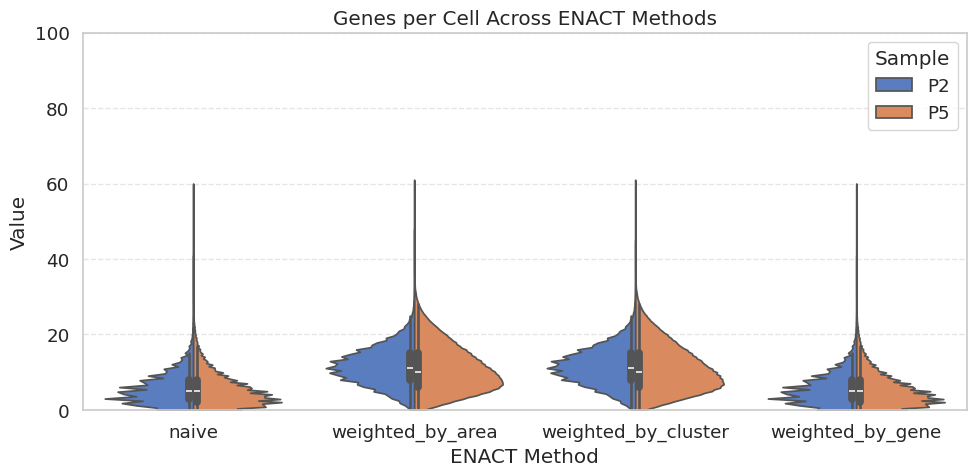

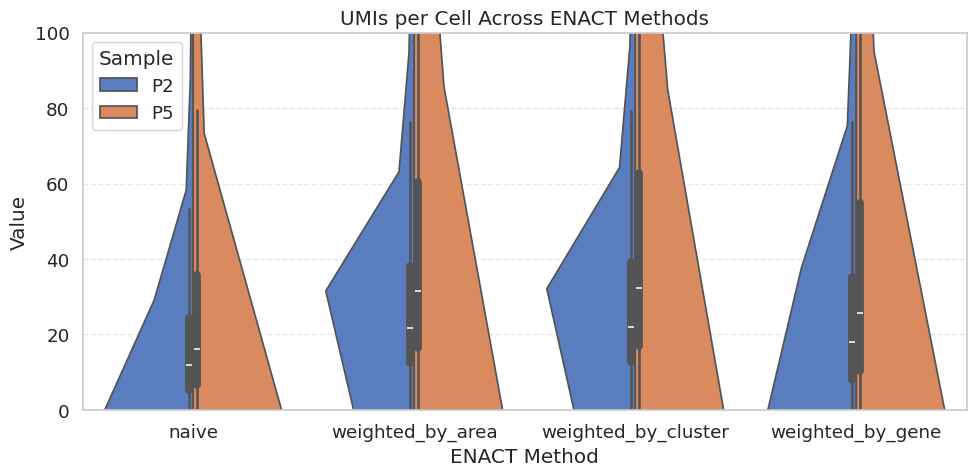

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the two QC metrics
metrics_to_plot = ["n_genes_by_counts", "total_counts"]
titles = {
    "n_genes_by_counts": "Genes per Cell Across ENACT Methods",
    "total_counts": "UMIs per Cell Across ENACT Methods"
}

# Plot each metric separately
for metric in metrics_to_plot:
    plt.figure(figsize=(10, 5))
    sns.violinplot(
        x="method", y=metric, hue="sample", data=qc_plot_df,
        split=True, scale="width", cut=0, inner="box"
    )
    plt.title(titles[metric])
    plt.ylabel("Value")
    plt.xlabel("ENACT Method")
    plt.ylim(0,100)
    plt.grid(axis="y", linestyle="--", alpha=0.5)
    plt.legend(title="Sample")
    plt.tight_layout()
    plt.show()


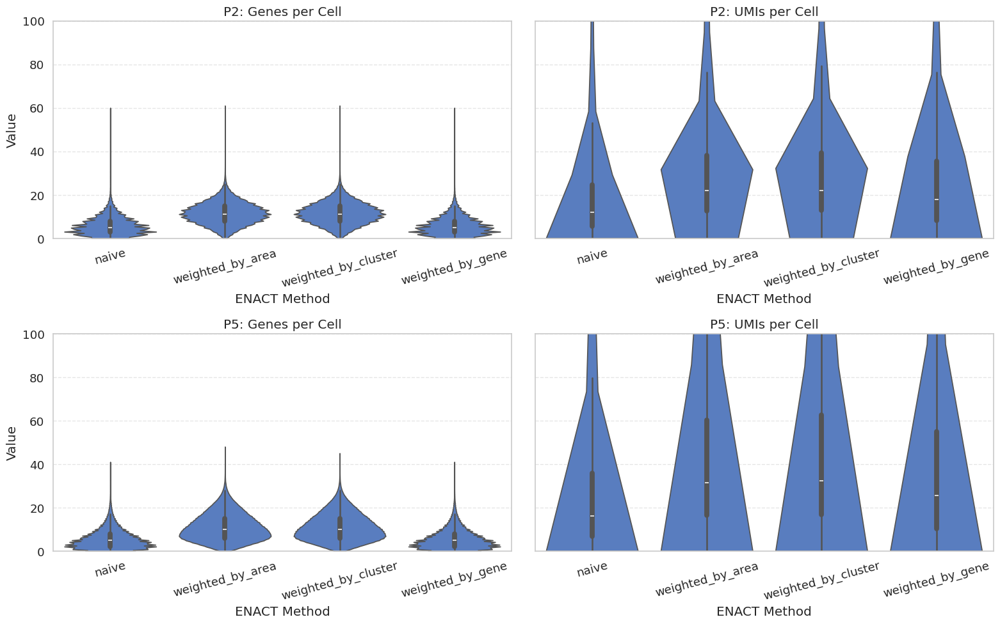

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharey=True)
qc_metrics = ["n_genes_by_counts", "total_counts"]
samples = ["P2", "P5"]
titles = {
    ("P2", "n_genes_by_counts"): "P2: Genes per Cell",
    ("P2", "total_counts"): "P2: UMIs per Cell",
    ("P5", "n_genes_by_counts"): "P5: Genes per Cell",
    ("P5", "total_counts"): "P5: UMIs per Cell"
}

# Loop through samples and metrics
for i, sample in enumerate(samples):
    for j, metric in enumerate(qc_metrics):
        ax = axes[i, j]
        sns.violinplot(
            data=qc_plot_df[qc_plot_df["sample"] == sample],
            x="method",
            y=metric,
            ax=ax,
            inner="box",
            scale="width",
            cut=0
        )
        ax.set_title(titles[(sample, metric)])
        ax.set_xlabel("ENACT Method")
        ax.set_ylabel("Value" if j == 0 else "")
        ax.set_ylim(0, 100)
        ax.tick_params(axis='x', rotation=15)
        ax.grid(axis="y", linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


P5_weighted_by_cluster -> shape: (294392, 1089), X type: <class 'scipy.sparse._csr.csr_matrix'>
           n_genes_by_counts  log1p_n_genes_by_counts  total_counts  \
id                                                                    
ID_281606                  9                 2.302585     29.781841   
ID_282072                  0                 0.000000      0.000000   
ID_282226                  2                 1.098612      0.985492   
ID_282281                  3                 1.386294      5.041641   
ID_282304                  7                 2.079442     15.494625   

           log1p_total_counts  pct_counts_in_top_50_genes  \
id                                                          
ID_281606            3.426925                  100.000000   
ID_282072            0.000000                         NaN   
ID_282226            0.685867                  100.000000   
ID_282281            1.798676                   99.999991   
ID_282304            2.803035           

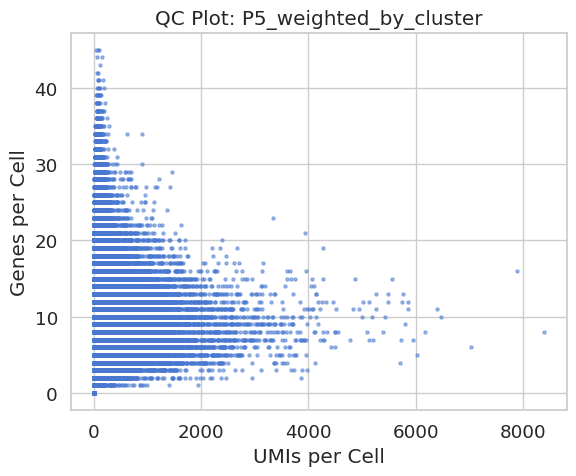

In [5]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# Select one ENACT path to test 
test_key = "P5_weighted_by_cluster"
adata_path = enact_paths[test_key]

# Load AnnData
adata = sc.read_h5ad(adata_path)

# Check basic structure
print(f"{test_key} -> shape: {adata.shape}, X type: {type(adata.X)}")

# Compute QC metrics (UMIs, gene counts, % in top genes)
sc.pp.calculate_qc_metrics(
    adata,
    expr_type='counts',
    inplace=True,
    percent_top=[50, 100]
)

# View a few results
print(adata.obs[[
    'n_genes_by_counts', 
    'log1p_n_genes_by_counts',
    'total_counts', 
    'log1p_total_counts', 
    'pct_counts_in_top_50_genes', 
    'pct_counts_in_top_100_genes'
]].head())

# Optional: visualize UMIs vs genes
plt.figure(figsize=(6, 5))
plt.scatter(
    adata.obs['total_counts'],
    adata.obs['n_genes_by_counts'],
    s=5, alpha=0.5
)
plt.xlabel("UMIs per Cell")
plt.ylabel("Genes per Cell")
plt.title(f"QC Plot: {test_key}")
plt.grid(True)
plt.tight_layout()
plt.show()


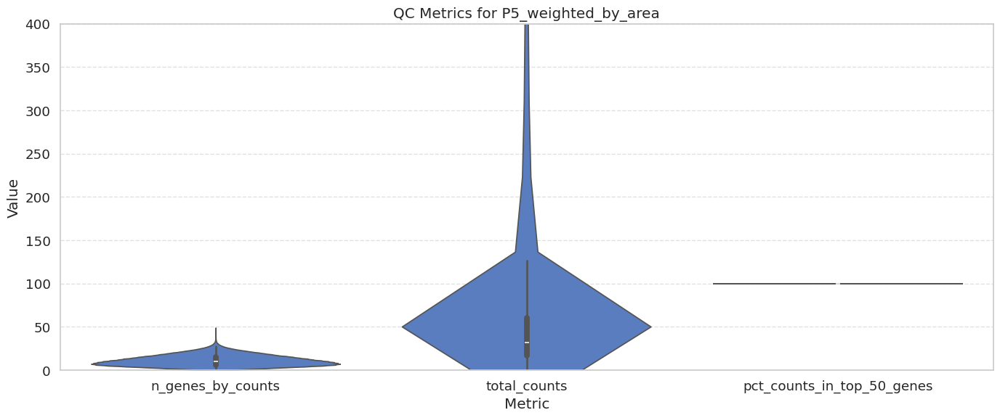

In [54]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the AnnData object
adata_path = "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_weighted_by_area_default/tmap/weighted_by_area|celltypist_cells_adata.h5"
adata = sc.read_h5ad(adata_path)

# Calculate QC metrics
sc.pp.calculate_qc_metrics(adata, inplace=True)

# Select desired QC metrics
qc_metrics = adata.obs[
    [
        "n_genes_by_counts",             # Genes per cell
        "total_counts",                  # UMIs per cell
        "pct_counts_in_top_50_genes",    # % UMIs in top 50 genes
    ]
].copy()


qc_metrics["cell_type"] = adata.obs.get("cell_type", "unknown")


qc_long = qc_metrics.melt(id_vars="cell_type", var_name="Metric", value_name="Value")

# Violin plot
plt.figure(figsize=(14, 6))
sns.violinplot(data=qc_long, x="Metric", y="Value", inner="box", scale="width")
plt.title("QC Metrics for P5_weighted_by_area")
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.ylim(0,400)
plt.tight_layout()
plt.show()


In [7]:
qc = adata.obs[["n_genes_by_counts", "total_counts", "pct_counts_in_top_50_genes"]]
print(qc.describe())


       n_genes_by_counts   total_counts  pct_counts_in_top_50_genes
count      294392.000000  294392.000000               292310.000000
mean           11.211643      85.766838                  100.000000
std             6.233389     227.018356                    0.000006
min             0.000000       0.000000                   99.999944
25%             6.000000      16.472780                  100.000000
50%            10.000000      31.520841                  100.000000
75%            15.000000      60.349810                  100.000000
max            48.000000    8480.702148                  100.000044


In [10]:
import pandas as pd
import numpy as np

# Load matrix from AnnData (dense version for safety)
X = adata.X.toarray() if not hasattr(adata.X, "tocsc") else adata.X.toarray()

# Get top 50 genes by total expression
top_50_idx = np.argsort(X.sum(axis=0))[::-1][:50]

# Create QC dataframe
qc_df = pd.DataFrame({
    "n_genes_by_counts": (X > 0).sum(axis=1),
    "total_counts": X.sum(axis=1),
    "pct_counts_in_top_50_genes": 100 * X[:, top_50_idx].sum(axis=1) / X.sum(axis=1),
}, index=adata.obs_names)

# Show first few rows (raw data)
print("First 10 cells (raw QC values):")
display(qc_df.head(10))

# Show summary statistics
print("Summary statistics for QC metrics:")
display(qc_df.describe().T)


First 10 cells (raw QC values):


,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes
id,,,
ID_281606,9,28.806211,100.000008
ID_282072,0,0.000000,NaN
ID_282226,2,0.985492,50.000000
ID_282281,3,5.630053,100.000000
ID_282304,7,13.608593,55.208450
ID_282350,13,45.318951,94.340431
ID_282544,5,4.644569,73.979019
ID_282603,3,1.458766,100.000000
ID_282629,1,0.777366,100.000000


Summary statistics for QC metrics:


,count,mean,std,min,25%,50%,75%,max
n_genes_by_counts,294392.0,11.211643,6.233389,0.0,6.000000,10.000000,15.000000,48.000000
total_counts,294392.0,85.766838,227.018356,0.0,16.472781,31.520843,60.349811,8480.702148
pct_counts_in_top_50_genes,292310.0,89.982117,14.791389,0.0,87.135345,95.245514,99.618790,100.000031


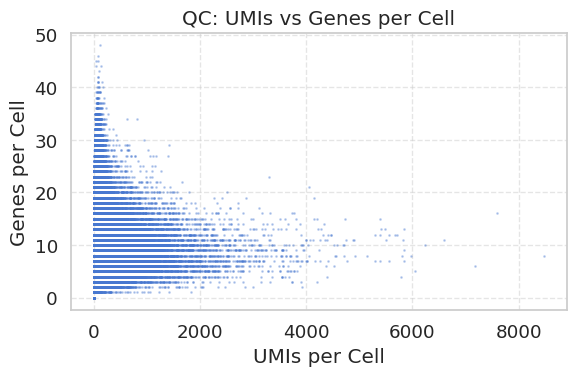

In [16]:


plt.figure(figsize=(6, 4))
plt.scatter(qc_df["total_counts"], qc_df["n_genes_by_counts"], alpha=0.3, s=1)
plt.xlabel("UMIs per Cell")
plt.ylabel("Genes per Cell")
plt.title("QC: UMIs vs Genes per Cell")
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


In [21]:
# Summary statistics
print("UMIs per cell (total_counts):")
print(qc_df["total_counts"].describe())

print("\nGenes per cell (n_genes_by_counts):")
print(qc_df["n_genes_by_counts"].describe())


UMIs per cell (total_counts):
count    294392.000000
mean         85.766838
std         227.018356
min           0.000000
25%          16.472780
50%          31.520841
75%          60.349810
max        8480.702148
Name: total_counts, dtype: float64

Genes per cell (n_genes_by_counts):
count    294392.000000
mean         11.211643
std           6.233389
min           0.000000
25%           6.000000
50%          10.000000
75%          15.000000
max          48.000000
Name: n_genes_by_counts, dtype: float64


# Metrics for Differnt Method ENACT


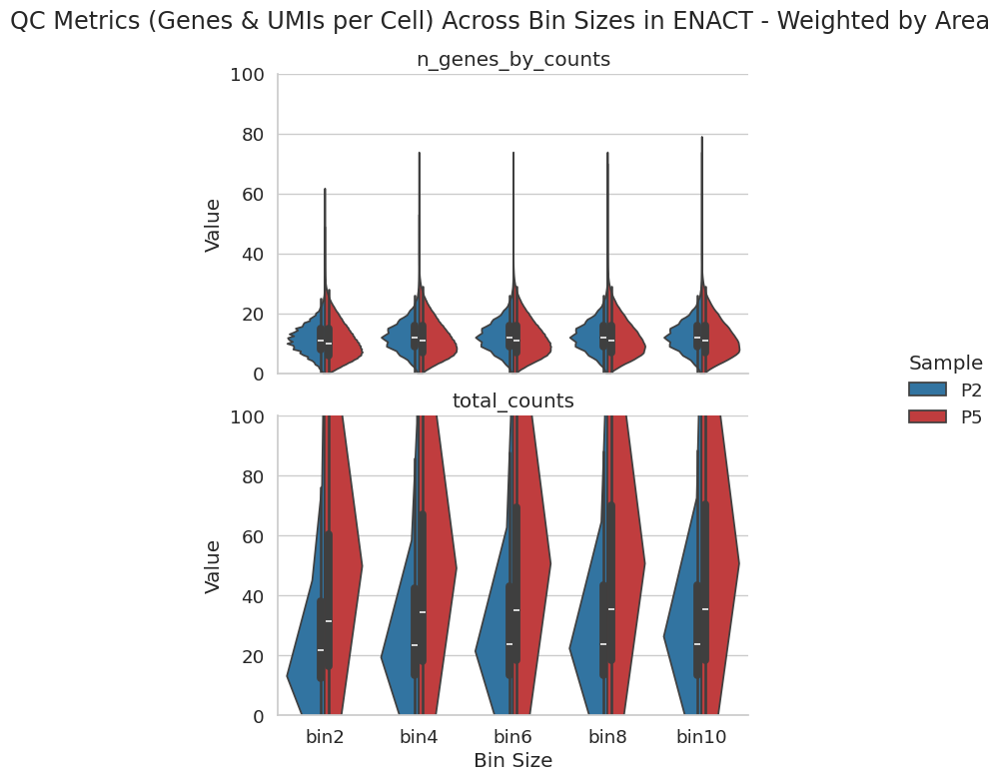

In [60]:
enact_paths_binned = {
    "P2_bin2": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2CRC_gpu_weighted_by_area_nbins2/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P2_bin4": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2CRC_gpu_weighted_by_area_nbins4/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P2_bin6": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2CRC_gpu_weighted_by_area_nbins6/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P2_bin8": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2CRC_gpu_weighted_by_area_nbins8/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P2_bin10": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P2_CRC/Cache/colon_P2CRC_gpu_weighted_by_area_nbins10/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P5_bin2": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_weighted_by_area_nbins2/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P5_bin4": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_weighted_by_area_nbins4/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P5_bin6": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_weighted_by_area_nbins6/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P5_bin8": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_weighted_by_area_nbins8/tmap/weighted_by_area|celltypist_cells_adata.h5",
    "P5_bin10": "/gpfs/commons/groups/innovation/jjoseph/enact_results/P5_CRC/Cache/colon_P5CRC_gpu_weighted_by_area_nbins10/tmap/weighted_by_area|celltypist_cells_adata.h5",
}


def load_qc_from_h5(label, path):
    adata = sc.read(path)
    adata.var_names_make_unique()

    if "counts" in adata.layers:
        adata.X = adata.layers["counts"].copy()

    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.obs["dataset"] = label
    return adata.obs[["n_genes_by_counts", "total_counts", "dataset"]].copy()


dfs = []
for label, path in enact_paths_binned.items():
    df = load_qc_from_h5(label, path)
    sample, bin_size = label.split("_")
    df["sample"] = sample
    df["bin"] = bin_size
    dfs.append(df)

qc_df_binned = pd.concat(dfs, ignore_index=True)


qc_long = qc_df_binned.melt(
    id_vars=["sample", "bin"],
    value_vars=["n_genes_by_counts", "total_counts"],
    var_name="QC Metric",
    value_name="Value"
)


# Plot with one metric per row for clarity
g = sns.catplot(
    data=qc_long,
    kind="violin",
    x="bin",
    y="Value",
    hue="sample",
    row="QC Metric",
    split=True,
    inner="box",
    scale="width",
    height=4,
    aspect=1.5,
    palette=custom_palette,
    hue_order=["P2", "P5"]
)

# Titles and axes
g.set_titles("{row_name}")
g.set_axis_labels("Bin Size", "Value")
g.set(ylim=(0, 100))
g._legend.set_title("Sample")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("QC Metrics (Genes & UMIs per Cell) Across Bin Sizes in ENACT - Weighted by Area")

plt.show()

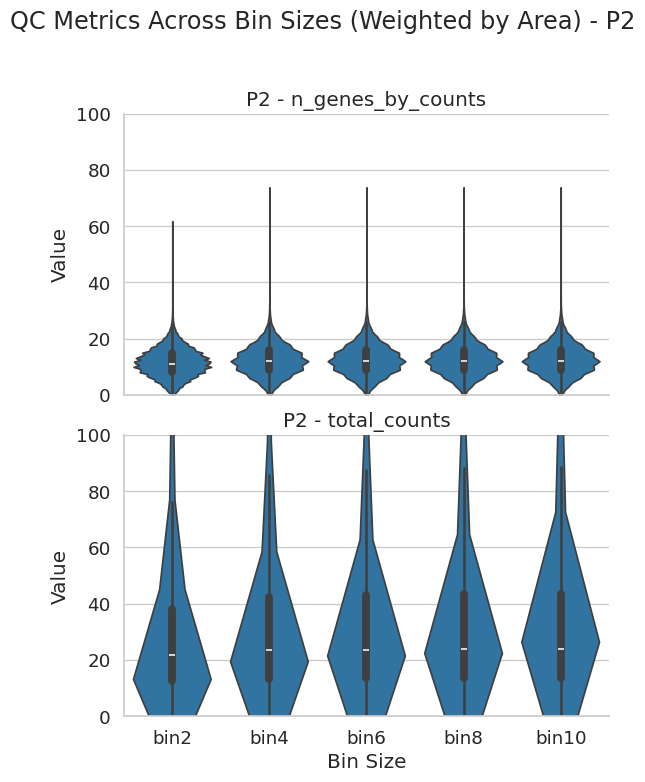

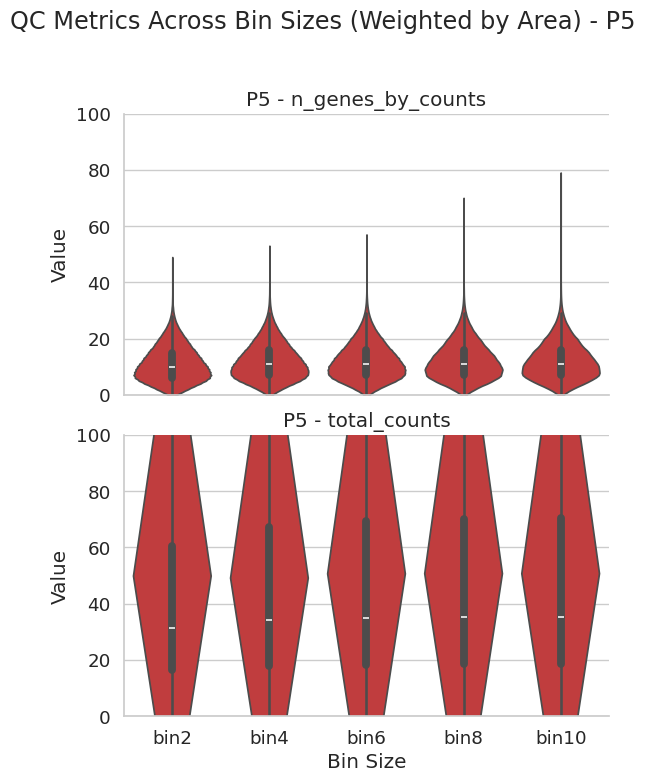

In [38]:
# Split into two separate DataFrames
qc_p2 = qc_long[qc_long["sample"] == "P2"]
qc_p5 = qc_long[qc_long["sample"] == "P5"]

for sample, df, color in [("P2", qc_p2, "#1f77b4"), ("P5", qc_p5, "#d62728")]:
    g = sns.catplot(
        data=df,
        kind="violin",
        x="bin",
        y="Value",
        row="QC Metric",
        inner="box",
        scale="width",
        height=4,
        aspect=1.5,
        color=color
    )

    g.set_titles(f"{sample} - {{row_name}}")
    g.set_axis_labels("Bin Size", "Value")
    g.set(ylim=(0, 100))
    g.fig.subplots_adjust(top=0.85)
    g.fig.suptitle(f"QC Metrics Across Bin Sizes (Weighted by Area) - {sample}")
    plt.show()
